In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [162]:
# Import
import scipy.stats as stats 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore') # To supress warnings 
from scipy.stats import skew
plt.style.use('ggplot')
from datetime import datetime
import missingno as msno # to get visualization on missing values
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.pipeline import Pipeline
import math
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_colwidth', 400)
pd.set_option('display.float_format', lambda x: '%.5f' % x) # To supress numerical display in scientific notations
import statsmodels.api as sm
import plotly.express as px
print("Load Libraries- Done")

Load Libraries- Done


In [5]:
data_path = 'data/vehicles.csv'
original_df = pd.read_csv(data_path)
original_df.head(3)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl


In [7]:
original_df.tail(3)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
426877,7301591147,wyoming,34990,2020.00000,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.00000,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.00000,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.00000,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy
426879,7301591129,wyoming,30590,2019.00000,bmw,4 series 430i gran coupe,good,NaN,gas,22716.00000,clean,other,WBA4J1C58KBM14708,rwd,NaN,coupe,NaN,wy


In [9]:
# Get an overview of the dataframe
print("Rows : ", original_df.shape[0])
print("Cols : ", original_df.shape[1])
print("#"*40,"\n","Features: \n\n", original_df.columns.tolist())
print("#"*40,"\nMissing values :\n\n", original_df.isnull().sum().sort_values(ascending=False))
print("#"*40,"\nPercent of missing :\n\n", round(original_df.isna().sum() / original_df.isna().count() * 100, 2))
print("#"*40,"\nUnique values : \n\n", original_df.nunique())

Rows :  426880
Cols :  18
######################################## 
 Features: 

 ['id', 'region', 'price', 'year', 'manufacturer', 'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status', 'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color', 'state']
######################################## 
Missing values :

 size            306361
cylinders       177678
condition       174104
VIN             161042
drive           130567
paint_color     130203
type             92858
manufacturer     17646
title_status      8242
model             5277
odometer          4400
fuel              3013
transmission      2556
year              1205
id                   0
region               0
price                0
state                0
dtype: int64
######################################## 
Percent of missing :

 id              0.00000
region          0.00000
price           0.00000
year            0.28000
manufacturer    4.13000
model           1.24000
condition      40.79000
cyli

In [ ]:
original_df.info()

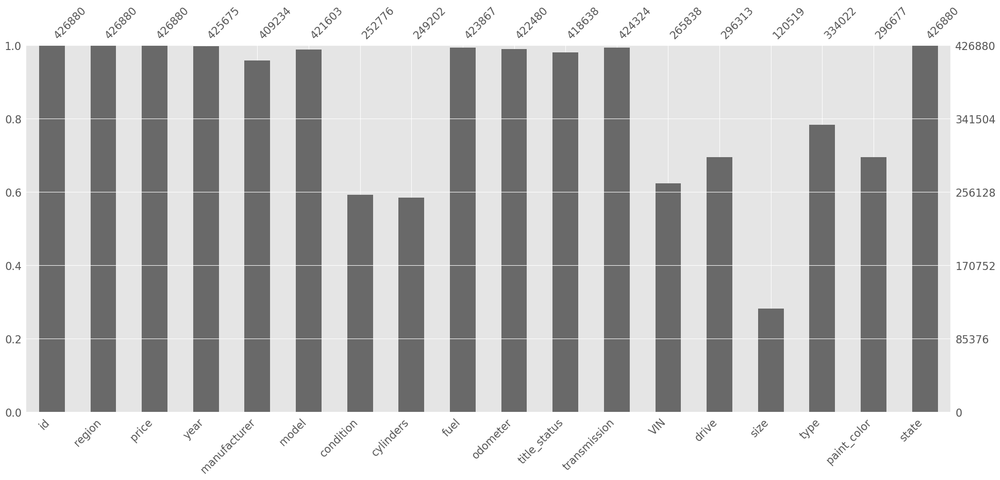

In [13]:
# Visualize missing values
msno.bar(original_df)
plt.show()
plt.savefig('missing_values.png')

In [19]:
df = df[df['price'] != 0] # Reviewing only non-zero price cars

### Observations
This preview shows that some columns potentially have a lot of missing values, so we will want to look into that later. 
1. **size** is missing 72% of the values.
2. **condition**, **cylinders**, **drive**, **type** and **paint_color** have 20-40% missing values.
3. **id**, **VIN** have high cardinality and these features may not be informative.
4. **region** and **state** features have overlap and may have duplicate values. 
5. **year** is available but needs to be converted into age of the car.

In [21]:
# Making a list of categorical variables 
cat_cols = [
    "region",
    "manufacturer",
    "model",
    "condition",
    "cylinders",
    "fuel",
    "title_status",
    "transmission",
    "drive",
    "size",
    "type",
    "paint_color",
    "state",
    "VIN"
]
print(f'There are: {len(cat_cols)} number of categorical variables.') # Print how many columns total are categorical variables
print("#" * 40)
# Print number of count of each unique value in each columns
for col in cat_cols:
    print(original_df[col].value_counts())
    print("#" * 40)

There are: 14 number of categorical variables.
########################################
region
columbus                   3608
jacksonville               3562
spokane / coeur d'alene    2988
eugene                     2985
fresno / madera            2983
                           ... 
meridian                     28
southwest MS                 14
kansas city                  11
fort smith, AR                9
west virginia (old)           8
Name: count, Length: 404, dtype: int64
########################################
manufacturer
ford               70985
chevrolet          55064
toyota             34202
honda              21269
nissan             19067
jeep               19014
ram                18342
gmc                16785
bmw                14699
dodge              13707
mercedes-benz      11817
hyundai            10338
subaru              9495
volkswagen          9345
kia                 8457
lexus               8200
audi                7573
cadillac            6953
chrysler  

### Observations
1. **ford** manufactured cars had the most number of cars sold.
2. **f-150** and **silverado 1500** from **ford** had the highest number of cars sold.
3. **6 cylinders** cars had the highest number of cars sold.
4. Most of the cars sold used **gasoline** fuel.
5. **white** is the color of highest number of cars **color** sold.
6. **sedan88** is the highest number of cars **type** sold. 

## Data Preprocessing 

In [23]:
# Preprocessing function
def data_preprocessing(url): 
    df = pd.read_csv(url)  # load data
    df = df.drop(columns= ['id', 'VIN'], axis=1) # drop uninformative columns
    df = df.drop(columns= ['region', 'state'], axis=1) # drop column with location information for simplicity 
    # df = df.drop(columns= 'manufacturer', axis=1) # drop the manufacturer column due to high cardinality issues
    df = df.drop(columns= 'model', axis=1) # drop high cardinality 'model' column
    df = df.drop(columns= 'size', axis=1) # drop column with more than 50% missing values 
    df = df.drop(columns= ['condition', 'cylinders', 'drive', 'type', 'paint_color'], axis=1) # drop categorical columns that had 20-40% missing values
    df = df[df['price'] != 0] # drop rows where price == 0
    df = df.dropna() # drop the NaNs 
    current_year = datetime.now().year
    df['car_age'] = current_year - df['year']
    # df = df.drop(columns= 'year', axis=1) # no longer need year since now we have car_age
    
    return df


df = data_preprocessing(data_path)
df.head()

,price,year,manufacturer,fuel,odometer,title_status,transmission,car_age
27,33590,2014.00000,gmc,gas,57923.00000,clean,other,11.00000
28,22590,2010.00000,chevrolet,gas,71229.00000,clean,other,15.00000
29,39590,2020.00000,chevrolet,gas,19160.00000,clean,other,5.00000
30,30990,2017.00000,toyota,gas,41124.00000,clean,other,8.00000
31,15000,2013.00000,ford,gas,128000.00000,clean,automatic,12.00000


In [ ]:
df.shape

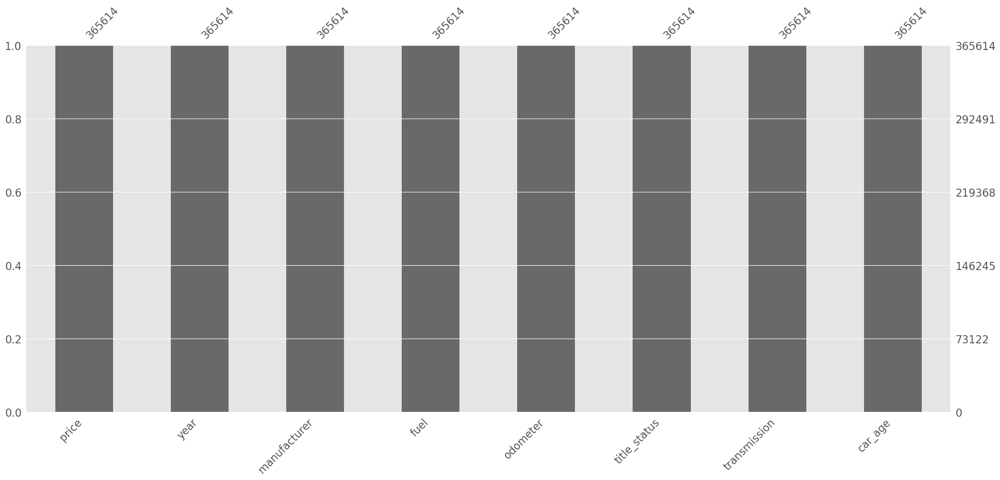

In [25]:
# Check missing values
msno.bar(df)
plt.show()

In [27]:
df.sample(10)

,price,year,manufacturer,fuel,odometer,title_status,transmission,car_age
134515,17000,2020.00000,kia,gas,30257.00000,clean,automatic,5.00000
370315,21590,2016.00000,nissan,gas,71390.00000,clean,other,9.00000
291793,19990,2017.00000,jeep,gas,23248.00000,clean,other,8.00000
208743,6495,2013.00000,dodge,gas,157068.00000,clean,automatic,12.00000
136817,7000,2015.00000,nissan,gas,131001.00000,clean,automatic,10.00000
264981,12697,2014.00000,ford,gas,99591.00000,clean,automatic,11.00000
21329,17900,2016.00000,ford,gas,291000.00000,clean,automatic,9.00000
100768,14900,2011.00000,rover,gas,123616.00000,clean,automatic,14.00000
282953,5500,2012.00000,nissan,gas,129000.00000,clean,automatic,13.00000
116445,17500,1994.00000,ford,gas,36700.00000,clean,manual,31.00000


In [29]:
# group bys 
manufacturer_counts = df.groupby('manufacturer')['manufacturer'].count().sort_values(ascending=False)
print(manufacturer_counts)

manufacturer
ford               62882
chevrolet          49142
toyota             30396
honda              19258
jeep               16840
nissan             16669
ram                15890
gmc                14864
bmw                13423
dodge              11882
mercedes-benz      10002
hyundai             9037
subaru              8740
volkswagen          8706
lexus               7523
kia                 7343
audi                6986
cadillac            6307
acura               5586
chrysler            5419
buick               5053
mazda               4880
infiniti            4401
lincoln             3900
volvo               3228
mitsubishi          2945
mini                2191
pontiac             2184
rover               1915
jaguar              1876
porsche             1249
mercury             1117
saturn              1053
alfa-romeo           861
tesla                814
fiat                 754
harley-davidson      120
ferrari               80
datsun                63
aston-martin

In [35]:
# group bys with df_filtered
manufacturer_counts = df_filtered.groupby('manufacturer')['manufacturer'].count().sort_values(ascending=False)
print(manufacturer_counts)

manufacturer
ford               37909
chevrolet          28236
toyota             16095
ram                11902
nissan             11182
jeep               10791
gmc                 9590
honda               9401
bmw                 9167
dodge               7696
hyundai             6614
volkswagen          6139
mercedes-benz       6134
kia                 5901
audi                5521
subaru              5398
lexus               4449
acura               3997
cadillac            3859
infiniti            3206
buick               3040
chrysler            2975
mazda               2974
lincoln             2612
mitsubishi          2066
volvo               1892
mini                1528
jaguar              1408
rover               1383
alfa-romeo           831
tesla                813
fiat                 722
porsche              626
harley-davidson       42
ferrari               24
aston-martin          12
pontiac                1
land rover             1
Name: manufacturer, dtype: int64


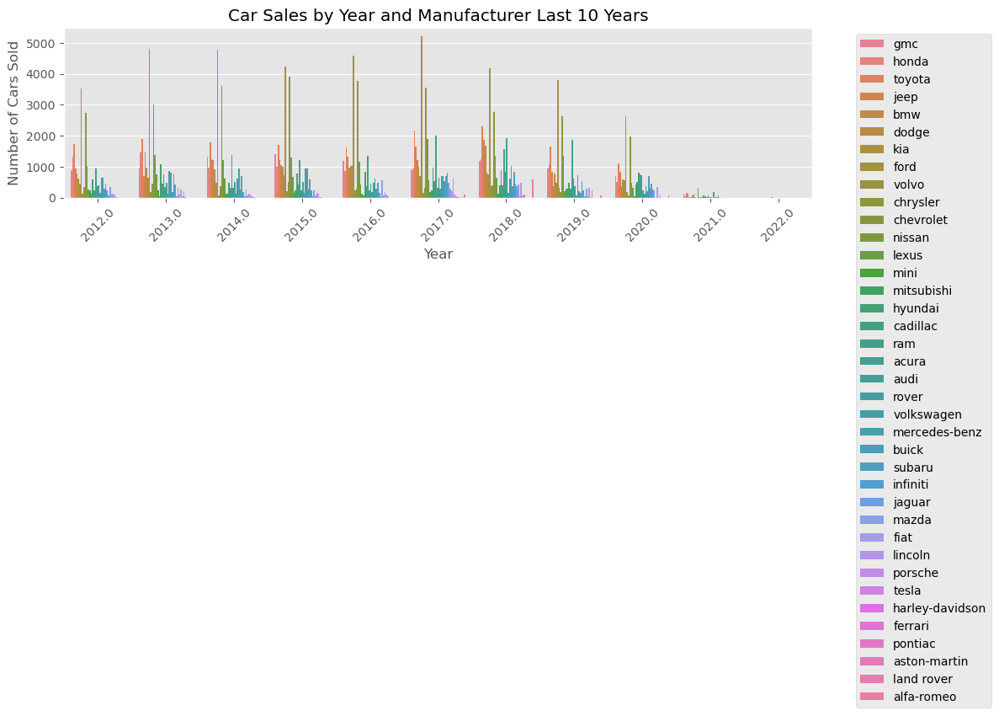

In [41]:
# Check if there is a time-series trend in number of cars sold vs manufacturers in the last 10 years
current_year = 2022
start_year = current_year - 10
df_filtered = df[df['year'] >= start_year]

plt.figure(figsize=(12,6))
ax = sns.countplot(data=df_filtered, x='year', hue='manufacturer')

# Rotate x-axis for readability
plt.xticks(rotation=45)

# Add labels and titles
plt.xlabel("Year")
plt.ylabel("Number of Cars Sold")
plt.title("Car Sales by Year and Manufacturer Last 10 Years")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")

# Adjust layout
plt.tight_layout()
plt.show()
plt.savefig('sales_by_manufacturer_last_10_yr.png')

<Figure size 640x480 with 0 Axes>

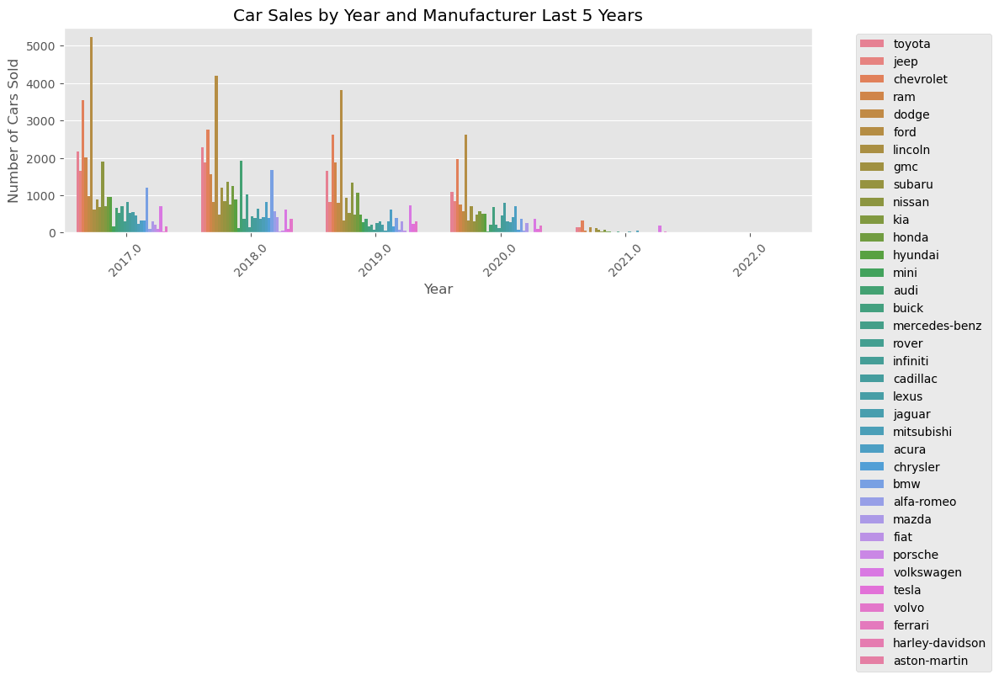

In [43]:
# Check if there is a time-series trend in number of cars sold vs manufacturers in the last 5 years
current_year = 2022
start_year = current_year - 5
df_filtered = df[df['year'] >= start_year]

plt.figure(figsize=(12,6))
ax = sns.countplot(data=df_filtered, x='year', hue='manufacturer')

# Rotate x-axis for readability
plt.xticks(rotation=45)

# Add labels and titles
plt.xlabel("Year")
plt.ylabel("Number of Cars Sold")
plt.title("Car Sales by Year and Manufacturer Last 5 Years")
plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")

# Adjust layout
plt.tight_layout()
plt.show()

## EDA


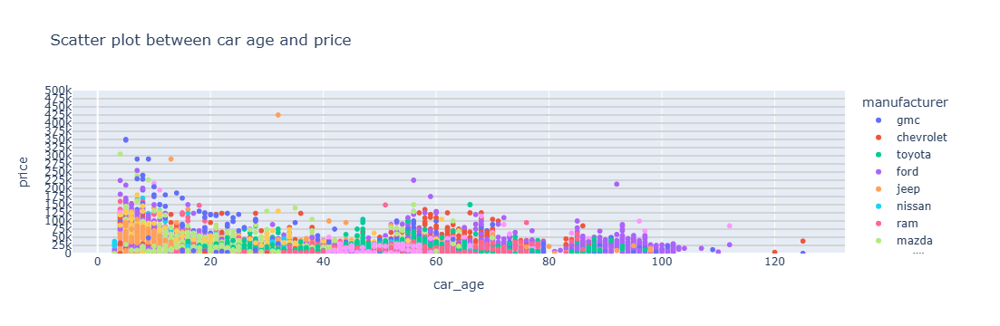

In [45]:
# Scatter plot
fig = px.scatter(df, x='car_age', y='price', color='manufacturer', title='Scatter plot between car age and price')
fig.update_layout(
    yaxis=dict(
        gridcolor='LightGray',
        gridwidth=2,
        range=[0, 500000],
        tickmode='linear',
        dtick=25000
    )
)

fig.show()

In [ ]:
# Scatter plot
fig = px.scatter(df, x='odometer', y='price', color='manufacturer', title='Scatter plot between car age and price')
fig.update_layout(
    yaxis=dict(
        gridcolor='LightGray',
        gridwidth=2,
        range=[0, 500000],
        tickmode='linear',
        dtick=25000
    )
)

fig.show()

## Feature Engineering

In [56]:
# Instantiate OneHotEncoder 
encoder = OneHotEncoder(sparse_output=False)

# Define feature engineering function
def feature_engineering(url): 
    try:
        df = pd.read_csv(url)  # load data
        df = df.drop(columns=['id', 'VIN'], axis=1) # drop uninformative columns
        df = df.drop(columns=['region', 'state'], axis=1) # drop column with location information for simplicity 
        df = df.drop(columns='model', axis=1) # drop high cardinality 'model' column
        df = df.drop(columns='size', axis=1) # drop column with more than 50% missing values 
        df = df.drop(columns=['condition', 'cylinders', 'drive', 'type', 'paint_color'], axis=1) # drop categorical columns that had 20-40% missing values
        df = df[df['price'] != 0] # drop rows where price == 0
        df = df.dropna() # drop the NaNs 
        current_year = datetime.now().year
        df['car_age'] = current_year - df['year']
        df = df.drop(columns='year', axis=1) # no longer need year since now we have car_age
        df = df.drop(columns='manufacturer', axis=1) # dropping manufacturer due to high cardinality

        # Fit the encoder and transform the data
        categorical_features = ['fuel', 'transmission', 'title_status']
        encoder.fit(df[categorical_features])
        ohe_df = encoder.transform(df[categorical_features])

        # Get feature names
        feature_names = encoder.get_feature_names_out(categorical_features)

        # Create DataFrame with proper column names
        ohe_df = pd.DataFrame(ohe_df, columns=feature_names)

        selected_columns_df = df.drop(categorical_features, axis=1).reset_index(drop=True)
        ohe_df = ohe_df.reset_index(drop=True)
        final_df = pd.concat([selected_columns_df, ohe_df], axis=1)

        return final_df
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None


df = feature_engineering(data_path)
df.head()

,price,odometer,car_age,fuel_diesel,fuel_electric,fuel_gas,fuel_hybrid,fuel_other,transmission_automatic,transmission_manual,transmission_other,title_status_clean,title_status_lien,title_status_missing,title_status_parts only,title_status_rebuilt,title_status_salvage
0,33590,57923.00000,11.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,22590,71229.00000,15.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,39590,19160.00000,5.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
3,30990,41124.00000,8.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4,15000,128000.00000,12.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000


## Modeling

### First, Start with a Simple Linear Regression Model with 1 feature 'odometer'

In [90]:
df.shape

(365614, 17)

In [119]:
X1 = df[['odometer']]
y1 = df['price']

In [121]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)
print(X1_train.shape)
print(y1_train.shape)

(292491, 1)
(292491,)


In [123]:
model_lr1 = LinearRegression()
model_lr1.fit(X1_train, y1_train) 

LinearRegression()

In [125]:
model_lr1_pred = model_lr1.predict(X1_test)
model_lr1_rmse = mean_squared_error(y1_test, model_lr1_pred, squared=False)
print(model_lr1_rmse)

5536594.024644494


### Second, try Multiple Variables Linear Regression Model with polynomial features for the numerical features

In [129]:
numerical_features = ['car_age','odometer']
categorical_features = ['fuel_diesel', 'fuel_electric',
       'fuel_gas', 'fuel_hybrid', 'fuel_other', 'transmission_automatic',
       'transmission_manual', 'transmission_other', 'title_status_clean',
       'title_status_lien', 'title_status_missing', 'title_status_parts only',
       'title_status_rebuilt', 'title_status_salvage']

In [154]:
X2 = df[['car_age','odometer']]
y2 = df['price']

In [178]:
# Define the pipeline
model_lr2 = Pipeline([
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())  # Add the actual regression model
])

# Split the data
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Fit the model on training data
model_lr2.fit(X2_train, y2_train)

# Now you can use the fitted model to transform test data and make predictions
X2_test_transformed = model_lr2[:-1].transform(X2_test)  # Transform test data (excluding the regressor step)
model_lr2_pred = model_lr2.predict(X2_test)


In [180]:
model_lr2_rmse = mean_squared_error(y2_test, model_lr2_pred, squared=False)
print(model_lr2_rmse)

5535171.834326429


### Third, try Ridge Regression Model 

In [166]:
# Ridge Regression
alpha_values = np.logspace(0, 2, num=10)
param_grid = {'alpha': alpha_values}
ridge =Ridge()

grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Prepare the data
X3 = df.drop('price', axis=1)  # Use drop() method correctly
y3 = df['price']

# Split the data
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=42)

grid_search.fit(X3_train, y3_train)
best_alpha = grid_search.best_params_['alpha']
print(f'Best alpha value: {best_alpha}')

model_best_rr = grid_search.best_estimator_

Best alpha value: 100.0


In [172]:
model_best_rr_pred = model_best_rr.predict(X3_test)
model_best_rr_rmse = mean_squared_error(y3_test, model_best_rr_pred, squared=False)
print(model_best_rr_rmse)

5537982.433973576
